In [1]:
from camera import Camera, FakeCamera
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

In [2]:
cameras = [FakeCamera("images/img2.png"), FakeCamera("images/img4.png")]
#[FakeCamera("images/img6.png"), FakeCamera("images/img5.png"), FakeCamera("images/img4.png"), FakeCamera("images/img3.png"), FakeCamera("images/img2.png"), FakeCamera("images/img1.png"), FakeCamera("images/img0.png")]
imgs = {}
imgs["original"] = [cam.get_frame()[1] for cam in cameras]
imgs["gray"] = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in imgs["original"]]
imgs["gray_blur"] = [cv2.GaussianBlur(img, (5, 5), 0) for img in imgs["gray"]]

other_data = {}

In [3]:
def draw_points(img, points, color=(0, 0, 255)):
    height, width = img.shape[:2]
    for point in points:
        x, y = point
        x, y = int(x), int(y)
        
        if x < 0 or x >= width or y < 0 or y >= height:
            continue

        cv2.circle(img, (x, y), 3, color, -1)

def draw_algebraic_lines(img, lines, color=(0, 0, 255)):
    for line in lines:
        rho, theta = line
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 100000 * (-b))
        y1 = int(y0 + 100000 * (a))
        x2 = int(x0 - 100000 * (-b))
        y2 = int(y0 - 100000 * (a))
        cv2.line(img, (x1, y1), (x2, y2), color, 2)

def show_imgs(key):
    fig, axs = plt.subplots(1, len(imgs[key]), figsize=(20, 20))
    for i, img in enumerate(imgs[key]):
        axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[i].set_title(key)
        axs[i].axis("off")
    plt.show()

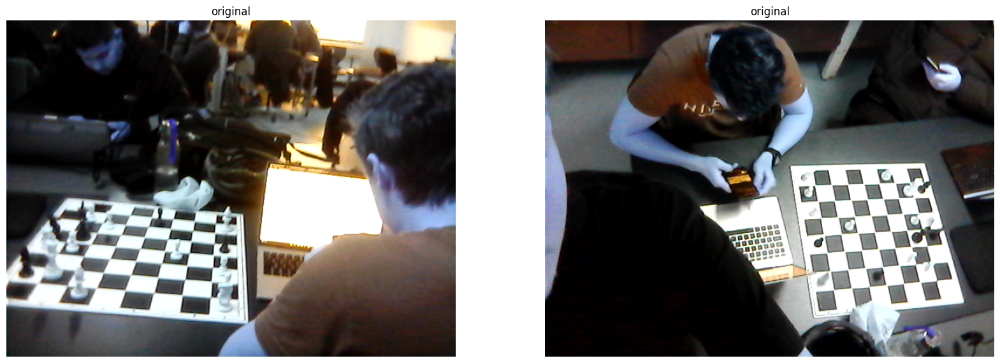

In [11]:
show_imgs("original")

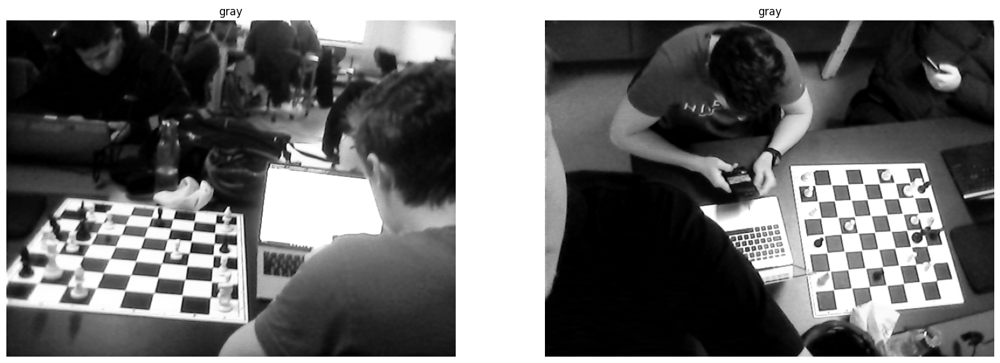

In [12]:
show_imgs("gray")

In [36]:
# find chessboard corners using cv2.findchessboardcorners
corners = [cv2.findChessboardCorners(img, (9, 6), None) for img in imgs["gray"]]
imgs["corners"] = [cv2.drawChessboardCorners(img, (9, 6), corner, True) for img, corner in zip(imgs["original"], corners)]
show_imgs("corners")


[(False, None), (False, None)]


error: OpenCV(4.6.0) :-1: error: (-5:Bad argument) in function 'drawChessboardCorners'
> Overload resolution failed:
>  - corners is not a numerical tuple
>  - Expected Ptr<cv::UMat> for argument 'corners'


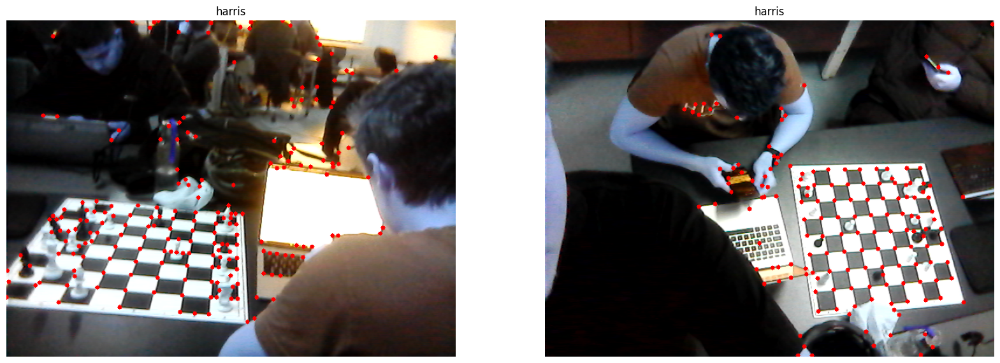

In [13]:
def harris_corners(gray_img):
    dst = cv2.cornerHarris(gray_img, 2, 3, 0.04)
    #result is dilated for marking the corners, not important
    dst = cv2.dilate(dst, None)

    # find centroids
    ret, dst = cv2.threshold(dst, 0.01 * dst.max(), 255, 0)
    dst = np.uint8(dst)
    ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

    # define the criteria to stop and refine the corners
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
    corners = cv2.cornerSubPix(gray_img, np.float32(centroids), (5, 5), (-1, -1), criteria)

    return corners

other_data["corners"] = [harris_corners(img.copy()) for img in imgs["gray_blur"]]

imgs["harris"] = [img.copy() for img in imgs["original"]]

for img, corner in zip(imgs["harris"], other_data["corners"]):
    draw_points(img, corner)

show_imgs("harris")

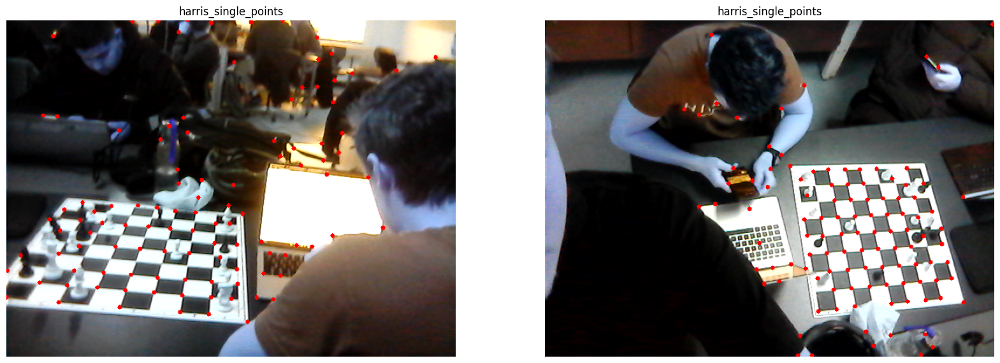

In [14]:
def remove_nearby_points(points, threshold):
    if len(points) == 0:
        return points
    
    new_points = [points[0]]
    for point in points:
        for new_point in new_points:
            if np.linalg.norm(new_point - point) < threshold:
                break
        else: 
            new_points.append(point)

    return new_points

other_data["corners_single_points"] = [remove_nearby_points(corner, 20) for corner in other_data["corners"]]

imgs["harris_single_points"] = [img.copy() for img in imgs["original"]]
for img, corner in zip(imgs["harris_single_points"], other_data["corners_single_points"]):
    draw_points(img, corner)

show_imgs("harris_single_points")

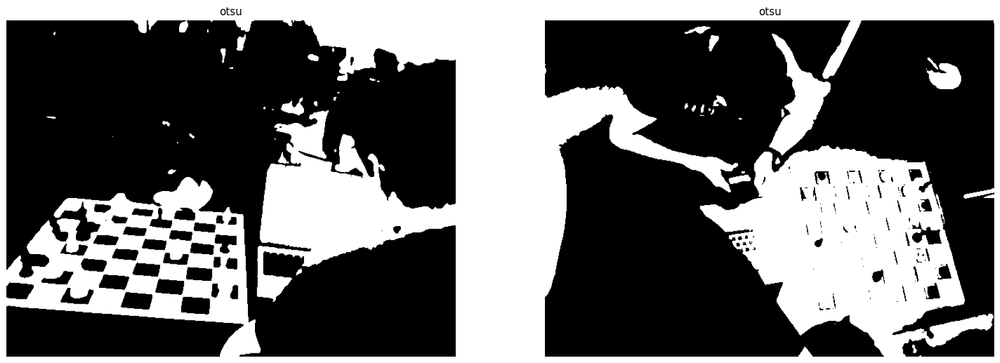

In [31]:
def otsu_binary(gray_img):
    ret2,th2 = cv2.threshold(gray_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return th2

imgs["otsu"] = [otsu_binary(img) for img in imgs["gray_blur"]]
show_imgs("otsu")

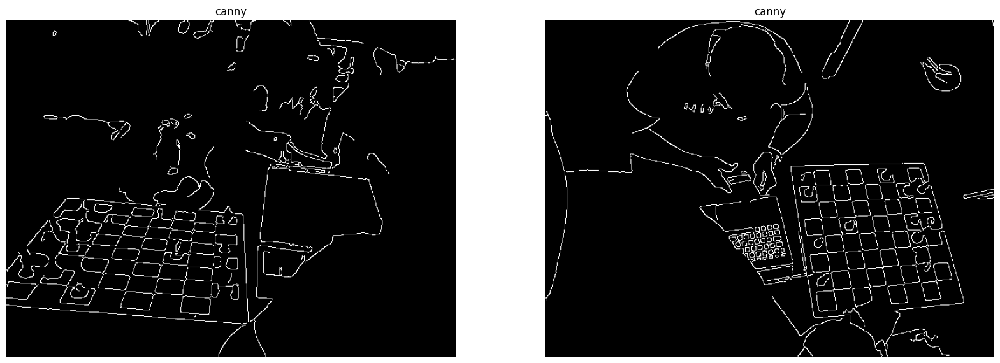

In [5]:
def canny_edges(gray_img, sigma = 0.5):
    v = np.median(gray_img)
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma*2.5) * v))
    return cv2.Canny(gray_img, 40, 255)

imgs["canny"] = [canny_edges(img) for img in imgs["gray_blur"]]

show_imgs("canny")

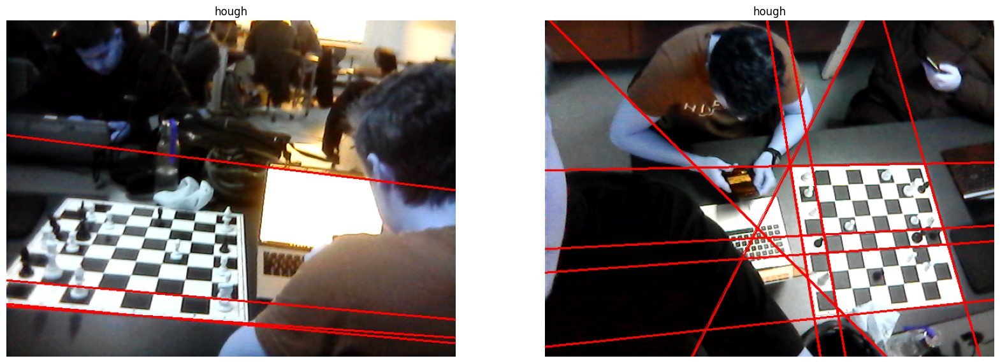

In [6]:
def hough_lines(canny_img):
    lines = cv2.HoughLines(canny_img, 1, math.pi/180.0, 80, np.array([]), 0, 0)
    if lines is None:
        return []
    return [line[0] for line in lines]

imgs["hough"] = [img.copy() for img in imgs["original"]]
other_data["hough"] = [hough_lines(img) for img in imgs["canny"]]

for img, lines in zip(imgs["hough"], other_data["hough"]):
    draw_algebraic_lines(img, lines)

show_imgs("hough")

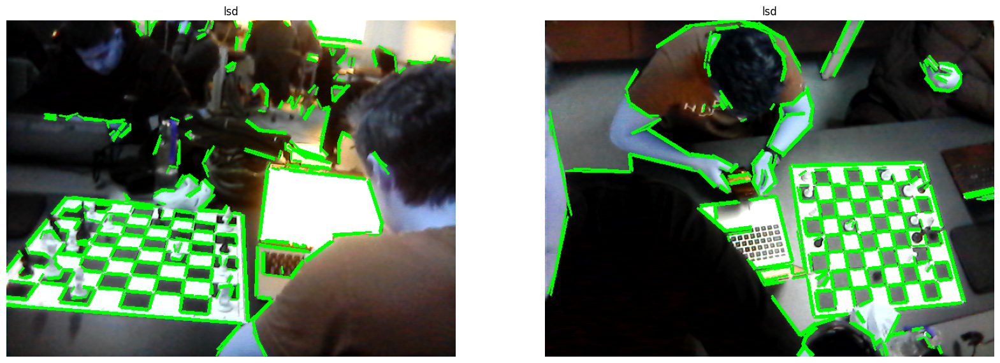

In [7]:
def lsd_lines(canny_img):
    lsd = cv2.createLineSegmentDetector(0)
    lines = lsd.detect(canny_img)[0]
    if lines is None:
        return []
    return [line[0] for line in lines]

imgs["lsd"] = [img.copy() for img in imgs["original"]]

other_data["lsd"] = [lsd_lines(img) for img in imgs["canny"]]
for img, lines in zip(imgs["lsd"], other_data["lsd"]):
    for line in lines:
        x1, y1, x2, y2 = line
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

show_imgs("lsd")

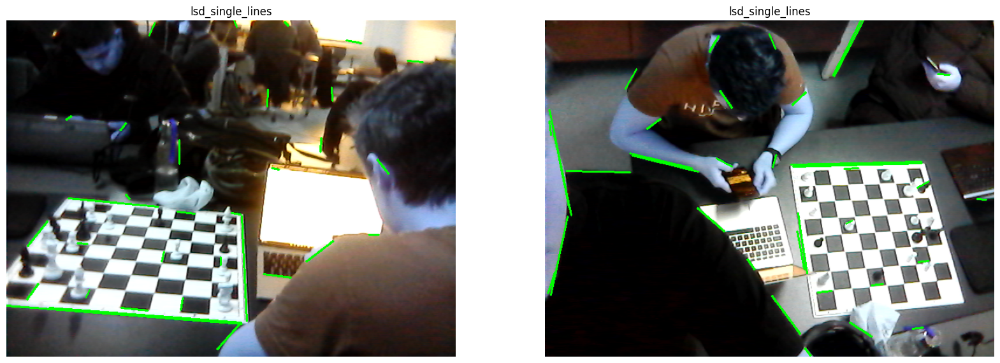

In [53]:
def combine_lsd_lines(lines):
    if len(lines) == 0:
        return []
    
    new_lines = [lines[0]]
    for line in lines:
        for new_line in new_lines:
            if np.linalg.norm(new_line - line) < 100:
                break
        else: 
            new_lines.append(line)

    return new_lines

other_data["lsd_single_lines"] = [combine_lsd_lines(line) for line in other_data["lsd"]]

imgs["lsd_single_lines"] = [img.copy() for img in imgs["original"]]
for img, lines in zip(imgs["lsd_single_lines"], other_data["lsd_single_lines"]):
    for line in lines:
        x1, y1, x2, y2 = line
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

show_imgs("lsd_single_lines")

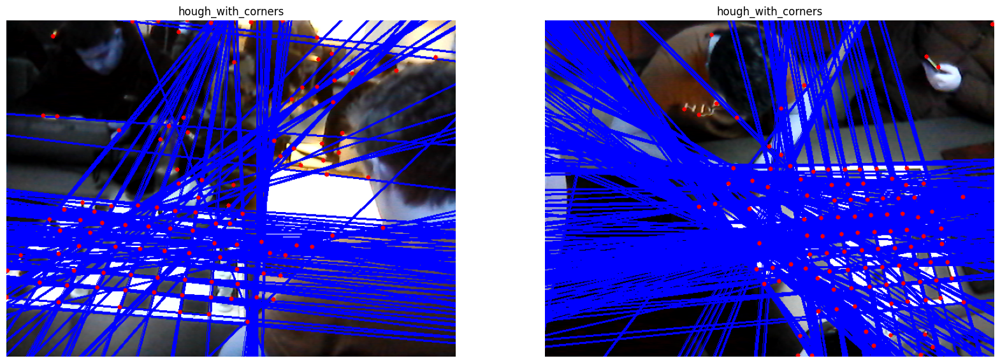

In [22]:
imgs["hough_with_corners"] = [img.copy() for img in imgs["original"]]
for img, lines, corners in zip(imgs["hough_with_corners"], other_data["hough"], other_data["corners_single_points"]):
    draw_algebraic_lines(img, lines, color=(255, 0, 0))
    draw_points(img, corners)

show_imgs("hough_with_corners")

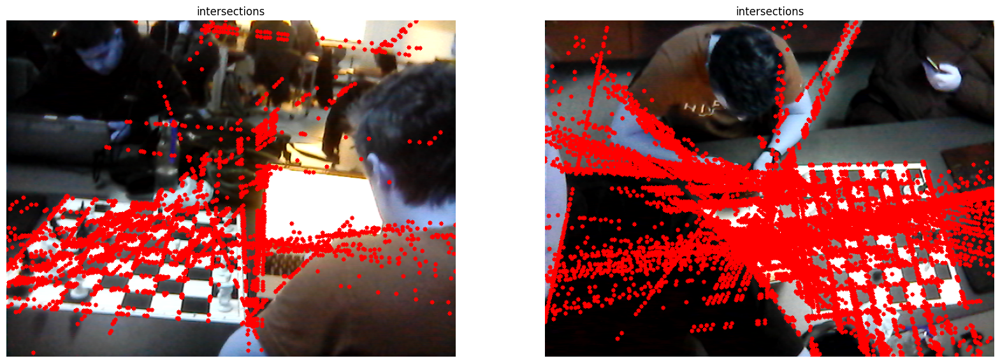

In [23]:
# find intersections between lines

def intersection(line1, line2):
    rho1, theta1 = line1
    rho2, theta2 = line2
    A = np.array([
        [math.cos(theta1), math.sin(theta1)],
        [math.cos(theta2), math.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    try:
        x0, y0 = np.linalg.solve(A, b)
        x0, y0 = int(x0), int(y0)
        return (x0, y0)
    except np.linalg.LinAlgError:
        return None

def find_intersections(lines):
    intersections = []
    for i, line1 in enumerate(lines):
        for line2 in lines[i+1:]:
            intersection_point = intersection(line1, line2)
            if intersection_point is not None:
                intersections.append(intersection_point)
    return intersections

other_data["intersections"] = [find_intersections(lines) for lines in other_data["hough"]]

imgs["intersections"] = [img.copy() for img in imgs["original"]]
for img, intersections in zip(imgs["intersections"], other_data["intersections"]):
    draw_points(img, intersections)

show_imgs("intersections")

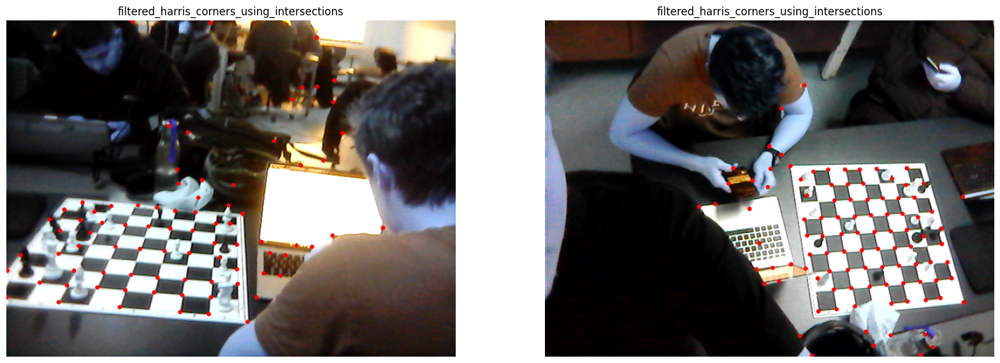

In [24]:
def filter_harris_corners_using_intersections(harris, intersections, margin = 10):
    filtered_corners = []
    for corner in harris:
        for intersection in intersections:
            if abs(corner[0] - intersection[0]) < margin and abs(corner[1] - intersection[1]) < margin:
                filtered_corners.append(corner)
                break
    return filtered_corners

other_data["filtered_harris_corners_using_intersections"] = [filter_harris_corners_using_intersections(harris, intersections) for harris, intersections in zip(other_data["corners_single_points"], other_data["intersections"])]

imgs["filtered_harris_corners_using_intersections"] = [img.copy() for img in imgs["original"]]
for img, corners in zip(imgs["filtered_harris_corners_using_intersections"], other_data["filtered_harris_corners_using_intersections"]):
    draw_points(img, corners)

show_imgs("filtered_harris_corners_using_intersections")

In [25]:
def get_harris_points_for_line(line, harris_corners, margin = 5):
    rho, theta = line
    a = math.cos(theta)
    b = math.sin(theta)
    x0 = a*rho
    y0 = b*rho
    p1 = np.array([x0 + 1000*(-b), y0 + 1000*(a)])
    p2 = np.array([x0 - 1000*(-b), y0 - 1000*(a)])

    points = []
    combined_dist = 0
    for i, corner in enumerate(harris_corners):
        p3 = np.array(corner)
        d = np.linalg.norm(np.cross(p2-p1, p1-p3))/np.linalg.norm(p2-p1)
        if d < margin:
            combined_dist += d
            points.append(i)
    
    return combined_dist, points

other_data["corner_points_for_line"] = [[get_harris_points_for_line(line, corners) for line in lines] for lines, corners in zip(other_data["hough"], other_data["filtered_harris_corners_using_intersections"])]

for corners in other_data["corner_points_for_line"]:
    print(corners)

[(1.358304650128848, [81]), (3.9300601464623326, [81]), (2.222676599951752, [67, 69, 70, 71, 72, 73, 74]), (0, []), (3.1743167504244925, [38, 40, 43, 44]), (10.8543094745884, [29, 31, 33, 35, 44]), (5.717266659077257, [59, 60, 61, 64, 65, 66, 68]), (9.086993353895146, [2, 30, 54, 57]), (17.547094753799378, [29, 31, 33, 35, 36, 39, 42, 45, 48]), (2.6393309173932797, [76, 77, 78, 79, 80]), (8.079723501396018, [2, 30, 54, 57]), (23.281587242864656, [29, 30, 31, 33, 35, 36, 39, 42, 45, 48]), (14.04965093149245, [19, 20, 23, 28, 37]), (1.8379627849797469, [28, 81]), (14.718429286023689, [25, 35, 36, 39, 42, 45, 48]), (6.426618475576078, [25, 26, 32, 34, 41]), (7.006417749137299, [52, 58, 62, 63]), (3.7047260138484415, [20, 35, 49, 61, 71, 78]), (0.8486693873882613, [28, 81]), (4.707055968315864, [52, 58, 62, 63]), (9.317363619616547, [9, 23, 33, 47, 60, 70]), (8.08161064249296, [52, 54, 58]), (10.394732194948677, [67, 69, 70, 71, 72, 73, 74, 75]), (9.084254597469512, [46, 47, 49, 50, 51, 56

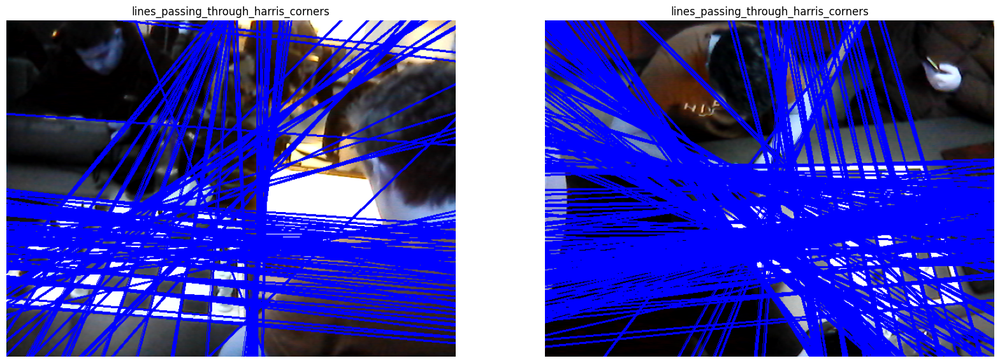

In [26]:
def lines_passing_through_harris_corners(lines, harris_corners):
    lines_passing_through_harris_corners = []
    for line in lines:
        dist, points = get_harris_points_for_line(line, harris_corners)
        if len(points) > 0:
            lines_passing_through_harris_corners.append((line, dist, points))
    return lines_passing_through_harris_corners

other_data["lines_passing_through_harris_corners"] = [lines_passing_through_harris_corners(lines, corners) for lines, corners in zip(other_data["hough"], other_data["filtered_harris_corners_using_intersections"])]

imgs["lines_passing_through_harris_corners"] = [img.copy() for img in imgs["original"]]
for img, lines in zip(imgs["lines_passing_through_harris_corners"], other_data["lines_passing_through_harris_corners"]):
    draw_algebraic_lines(img, [line[0] for line in lines], color=(255, 0, 0))

show_imgs("lines_passing_through_harris_corners")

In [14]:
def most_representative_lines_indexes(corner_points_for_line):
    indexed = [(i, *item) for i, item in enumerate(corner_points_for_line)]
    # remove lines that have no harris points or only one harris point
    remove_empty = [item for item in indexed if len(item[2]) > 1]
    sorte = sorted(remove_empty, key=lambda x: len(x[2]), reverse=True)

    if len(sorte) == 0:
        print("no lines found")
        exit()

    # find lines that have the most harris points, without having any other line with more than 1 point in common
    # if there are multiple lines with the same amount of points, choose the one with the smallest distance to the harris points
    most_representative_lines = [sorte[0][0]]
    for i, distance,  harris_points in sorte:
        add = True
        for line in most_representative_lines:
            if np.intersect1d(harris_points, corner_points_for_line[line][1]).size > 1:
                add = False
                break

        if add:
            most_representative_lines.append(i)

    return most_representative_lines

other_data["most_representative_lines_indexes"] = [most_representative_lines_indexes(corner_points_for_line) for corner_points_for_line in other_data["corner_points_for_line"]]
other_data["most_representative_lines"] = [[lines[i] for i in indexes] for lines, indexes in zip(other_data["hough"], other_data["most_representative_lines_indexes"])]

imgs["most_representative_lines"] = [img.copy() for img in imgs["original"]]

for img, lines in zip(imgs["most_representative_lines"], other_data["most_representative_lines"]):
    draw_algebraic_lines(img, lines, color=(255, 0, 0))

show_imgs("most_representative_lines")

no lines found


IndexError: list index out of range

: 

In [ ]:
def remove_non_parallel_lines(lines, margin = 1):
    # remove lines that are not parallel to at least one other line
    parallel = []
    for i, line in enumerate(lines):
        rho, theta = line
        for other_line in lines:
            if np.array_equal(line, other_line):
                continue

            other_rho, other_theta = other_line
            if abs(theta - other_theta) < margin:
                parallel.append(i)
                break

    return [lines[i] for i in parallel]

def split_lines_to_parallel_and_perpendicular(lines):
    parallel = []
    perpendicular = []
    for line in lines:
        rho, theta = line
        if abs(theta - math.pi/2) < math.pi/4:
            perpendicular.append(line)
        else:
            parallel.append(line)
    return parallel, perpendicular

other_data["parallel_lines"] = [remove_non_parallel_lines(lines) for lines in other_data["most_representative_lines"]]
other_data["parallel_and_perpendicular_lines"] = [split_lines_to_parallel_and_perpendicular(lines) for lines in other_data["parallel_lines"]]

imgs["parallel_and_perpendicular_lines"] = [img.copy() for img in imgs["original"]]
for img, lines in zip(imgs["parallel_and_perpendicular_lines"], other_data["parallel_and_perpendicular_lines"]):
    draw_algebraic_lines(img, lines[0], color=(255, 0, 0))
    draw_algebraic_lines(img, lines[1], color=(0, 255, 0))

show_imgs("parallel_and_perpendicular_lines")